# Diving into the datasets

In [1]:
#Lets have matplotlib "inline"
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
# Imports
from osgeo import gdal
import numpy as np
import matplotlib.pyplot as plt
import os, sys, time
import pprint as pp
import xarray as xr

from matplotlib import animation, rc
import glob

import geopandas as gpd

from pygeotools.lib import iolib, warplib, geolib, timelib, malib

#Set large figure sizes
rc('figure', figsize=(16.0, 12.0))
rc('animation', html='html5')


In [3]:
data_dir = 'data/dem_32_transOnly/'
filenames = os.listdir(data_dir)
filenames = sorted(filenames)
ref_file = data_dir + '20150131_0548_1020010038618500_102001003829CB00-DEM_32m_trans.tif'


In [4]:
path_to_files = [data_dir + fn for fn in filenames]
#pp.pprint(path_to_files)
ref_id = path_to_files.index(ref_file)
#print ("ref id: ", ref_id)
#print ("path_to_files[ref_id]: ", path_to_files[ref_id])
#print ("ref_file             : ", ref_file)

In [5]:
dataset_list = warplib.memwarp_multi_fn(path_to_files,  extent='union', res='min', t_srs=ref_file)


Warping all inputs to the following:
Resolution: 32.0
Extent: [473230.772, 3085731.302, 497009.303, 3103537.631]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs '
Resampling alg: cubic

1 of 29: data/dem_32_transOnly/20030507_0445_1010010001E01600_1010010001E01500-DEM_32m_trans.tif
nl: 556 ns: 743 res: 32.000
2 of 29: data/dem_32_transOnly/20121223_0456_1050410000E0AE00_1050410000E8C900-DEM_32m_trans.tif
nl: 556 ns: 743 res: 32.000
3 of 29: data/dem_32_transOnly/20121228_0506_102001001FB33300_102001002097D600-DEM_32m_trans.tif
nl: 556 ns: 743 res: 32.000
4 of 29: data/dem_32_transOnly/20130106_0456_102001001D141500_102001001DC53200-DEM_32m_trans.tif
nl: 556 ns: 743 res: 32.000
5 of 29: data/dem_32_transOnly/20131229_0456_10200100296A0900_10200100298D5F00-DEM_32m_trans.tif
nl: 556 ns: 743 res: 32.000
6 of 29: data/dem_32_transOnly/20140303_0447_1020010029AC1C00_102001002BD01800-DEM_32m_trans.tif
nl: 556 ns: 743 res: 32.000
7 of 29: data/dem_32_transOnly/20140307_0452_102

In [6]:
#Load datasets to NumPy masked arrays
dem_list = [iolib.ds_getma(i) for i in dataset_list]

# How are our datasets are distributed?

The yellow area is covered by several datasets, while the darker areas is covered by few datasets only.

<class 'numpy.ma.core.MaskedArray'>
(556, 743)
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15.]


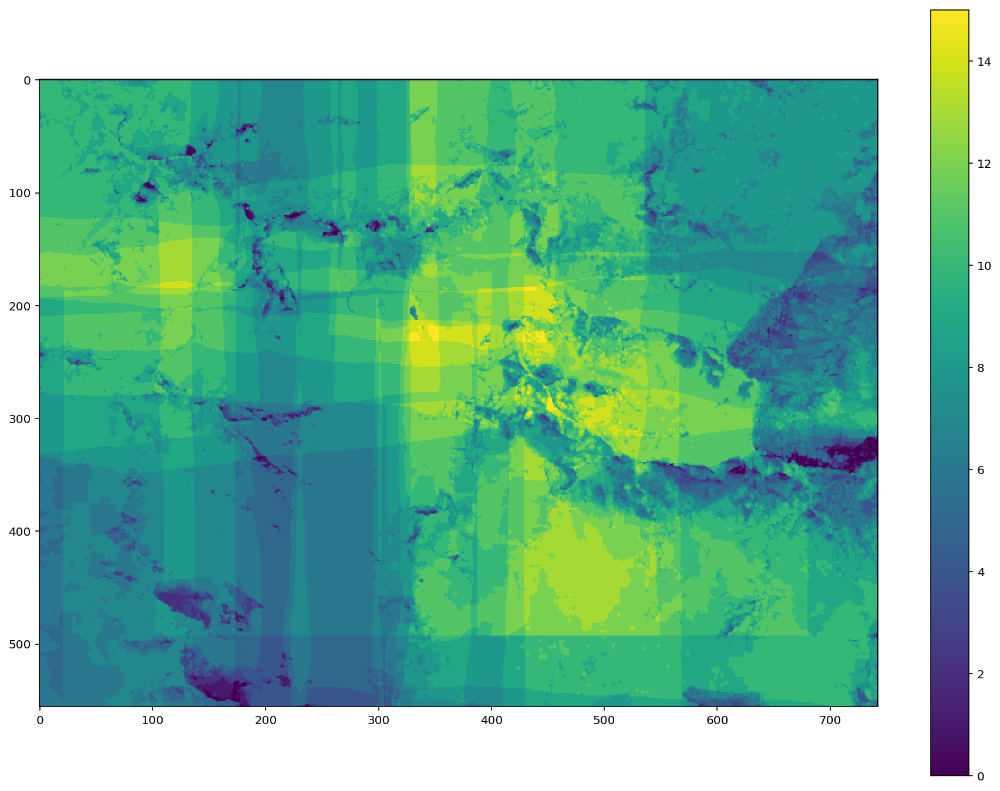

In [7]:
coverage = np.zeros(dem_list[ref_id].data.shape)
print(type(dem_list[ref_id]))
print(dem_list[ref_id].data.shape)
for i in range(len(dem_list)):
    coverage = coverage + (dem_list[i].data != 0)
fig = plt.Figure(figsize=(4,4))
plt.imshow(coverage)
plt.colorbar()
print (np.unique(coverage))

## Load the shape file

Input shp srs: +proj=longlat +datum=WGS84 +no_defs 
Specified output srs: +proj=utm +zone=45 +datum=WGS84 +units=m +no_defs 


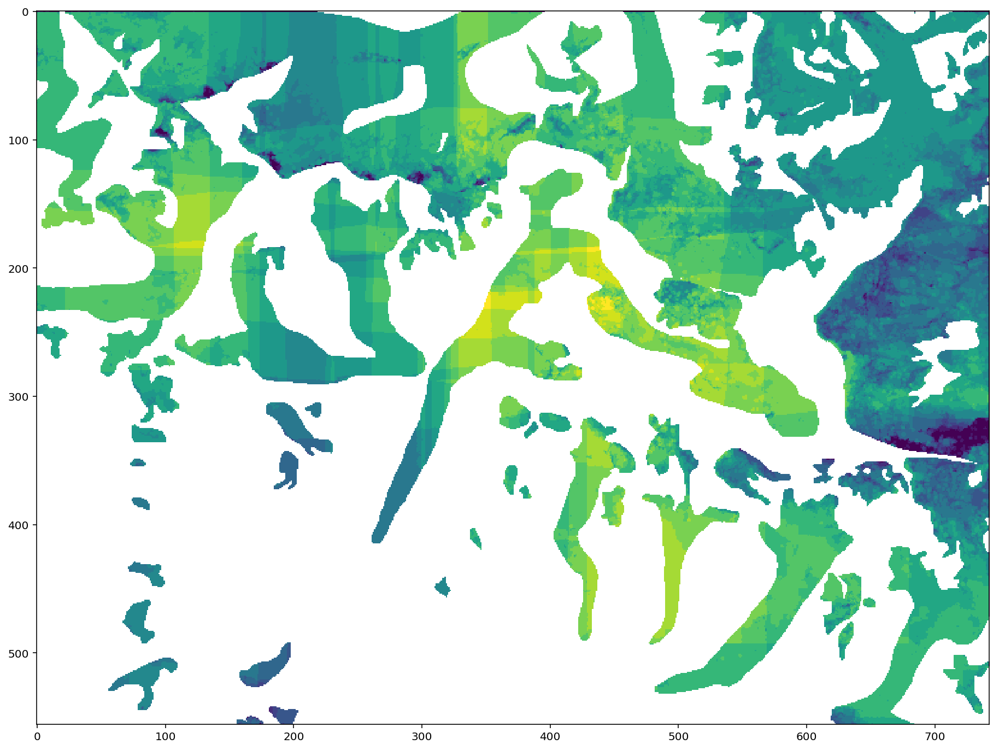

In [8]:
shp_fn = 'data/shapefiles/15_rgi60_SouthAsiaEast.shp'
#Create binary mask from polygon shapefile to match our warped raster datasets
#shp_mask = geolib.shp2array(shp_fn, ds_list[0])
#Now apply the mask to each array 
#dhdt_list_shpclip = [np.ma.array(dhdt, mask=shp_mask) for dhdt in dhdt_list]
#plot3panel(dhdt_list_shpclip, (-2, 2), titles, 'RdBu', 'Elevation Change Rate (m/yr)')

shp_mask = geolib.shp2array(shp_fn, dataset_list[ref_id])
#plt.imshow(shp_mask)
plt.imshow(np.ma.array(coverage, mask=shp_mask))

In [9]:
FID_shape = "3732" # ID of the glacier we are interested in
RGI60 = "RGI60-15.03733"
gpd_shape = gpd.read_file(shp_fn)
#khumbu_shape = gpd_shape["RGIId"==RGI60]
khumbu_shape = gpd_shape[gpd_shape['RGIId'] == RGI60]
khumbu_shape_filename = "data/shapefiles/khumbu_shape.shp"
khumbu_shape.to_file(khumbu_shape_filename)


Input shp srs: +proj=longlat +datum=WGS84 +no_defs 
Specified output srs: +proj=utm +zone=45 +datum=WGS84 +units=m +no_defs 


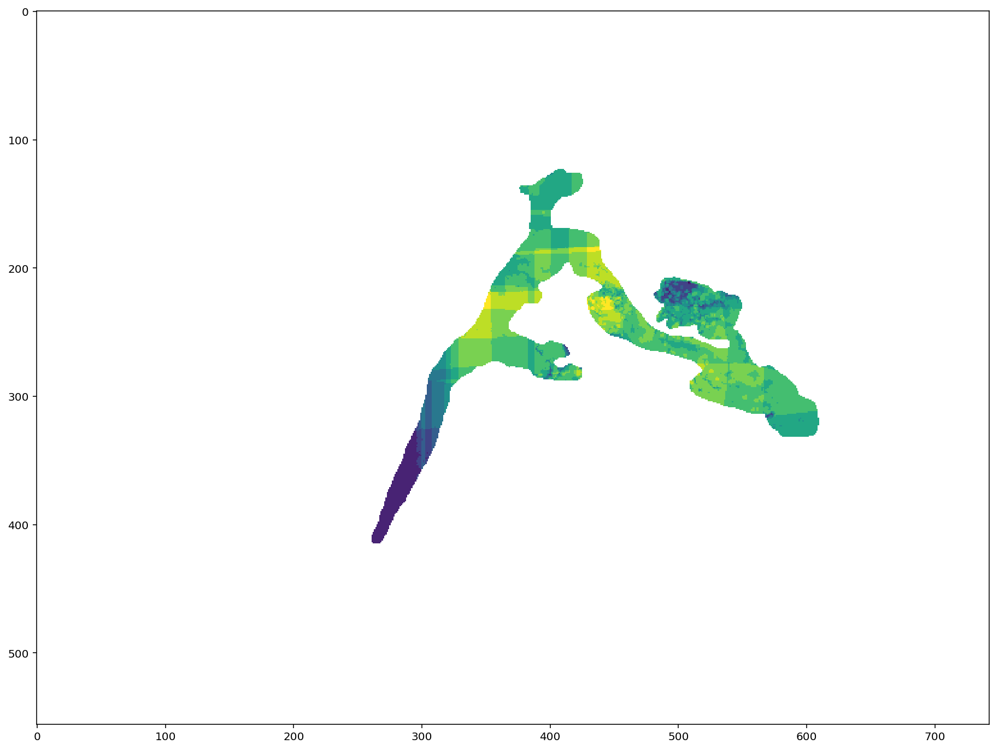

In [10]:
khumbu_shp_mask = geolib.shp2array(khumbu_shape_filename, dataset_list[ref_id])
plt.imshow(np.ma.array(coverage, mask=khumbu_shp_mask))

# Getting the change into x-arrays

Thansk Joachim!

In [11]:

class RasterSource(object):
    FILE_ENDING = 'trans.tif'

    def __init__(self, folder):
        self._folder = folder

    def file_list(self):
        return glob.glob(
            os.path.join(self._folder, '') + '**/*' + self.FILE_ENDING,
            recursive=True
        )


files = RasterSource(
    'data/dem_32_transOnly/'
).file_list()

raster_list = warplib.memwarp_multi_fn(
    files, extent='union', res='min', t_srs=files[0]
)

band_data = [iolib.ds_getma(i).filled(np.NaN) for i in raster_list]

x, y = geolib.get_xy_grids(raster_list[0])
time_list = np.array([timelib.fn_getdatetime(fn) for fn in files])

x_band_data = xr.DataArray(
    np.stack(band_data),
    coords={
        'lat': y[::,0],
        'lon': x[0,::],
        'time': time_list
    },
    dims=('time', 'lat', 'lon'),
    name='elevation'
)




Warping all inputs to the following:
Resolution: 32.0
Extent: [473230.772, 3085731.302, 497009.303, 3103537.631]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs '
Resampling alg: cubic

1 of 29: data/dem_32_transOnly/20140303_0447_1020010029AC1C00_102001002BD01800-DEM_32m_trans.tif
nl: 556 ns: 743 res: 32.000
2 of 29: data/dem_32_transOnly/20140307_0452_102001002C5CED00_102001002CCB4600-DEM_32m_trans.tif
nl: 556 ns: 743 res: 32.000
3 of 29: data/dem_32_transOnly/20140311_0520_103001002E546F00_103001002C956F00-DEM_32m_trans.tif
nl: 556 ns: 743 res: 32.000
4 of 29: data/dem_32_transOnly/20140514_0454_102001003001E400_102001002F6B1000-DEM_32m_trans.tif
nl: 556 ns: 743 res: 32.000
5 of 29: data/dem_32_transOnly/20160422_0501_103001005444C600_103001005401B300-DEM_32m_trans.tif
nl: 556 ns: 743 res: 32.000
6 of 29: data/dem_32_transOnly/20140311_0458_102001002CDDFB00_102001002CE68A00-DEM_32m_trans.tif
nl: 556 ns: 743 res: 32.000
7 of 29: data/dem_32_transOnly/20161105_0448_105

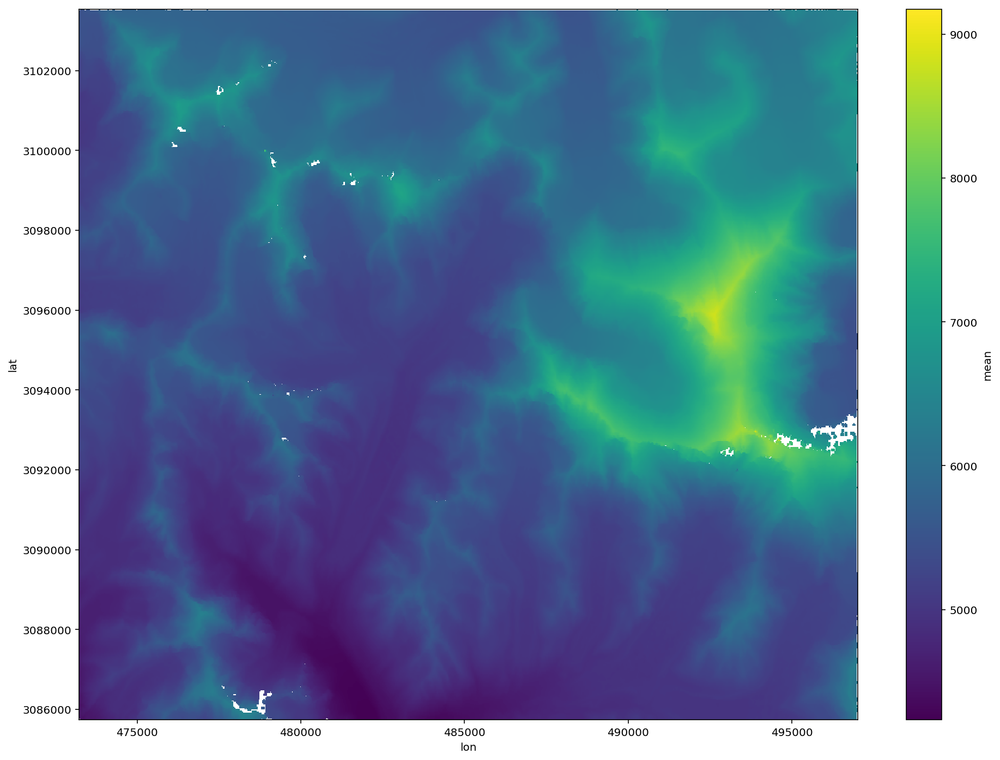

In [12]:
x_band_data = x_band_data.sortby('time')

x_band_data['mean'] = x_band_data.mean(dim=('time'))
x_band_data['count'] = x_band_data.count(dim='time')

x_band_data['mean'].plot()

plt.show()


# Presenting our data

(4235.348, 9173.815)
<class 'xarray.core.dataarray.DataArray'>
<class 'xarray.core.dataarray.DataArray'>


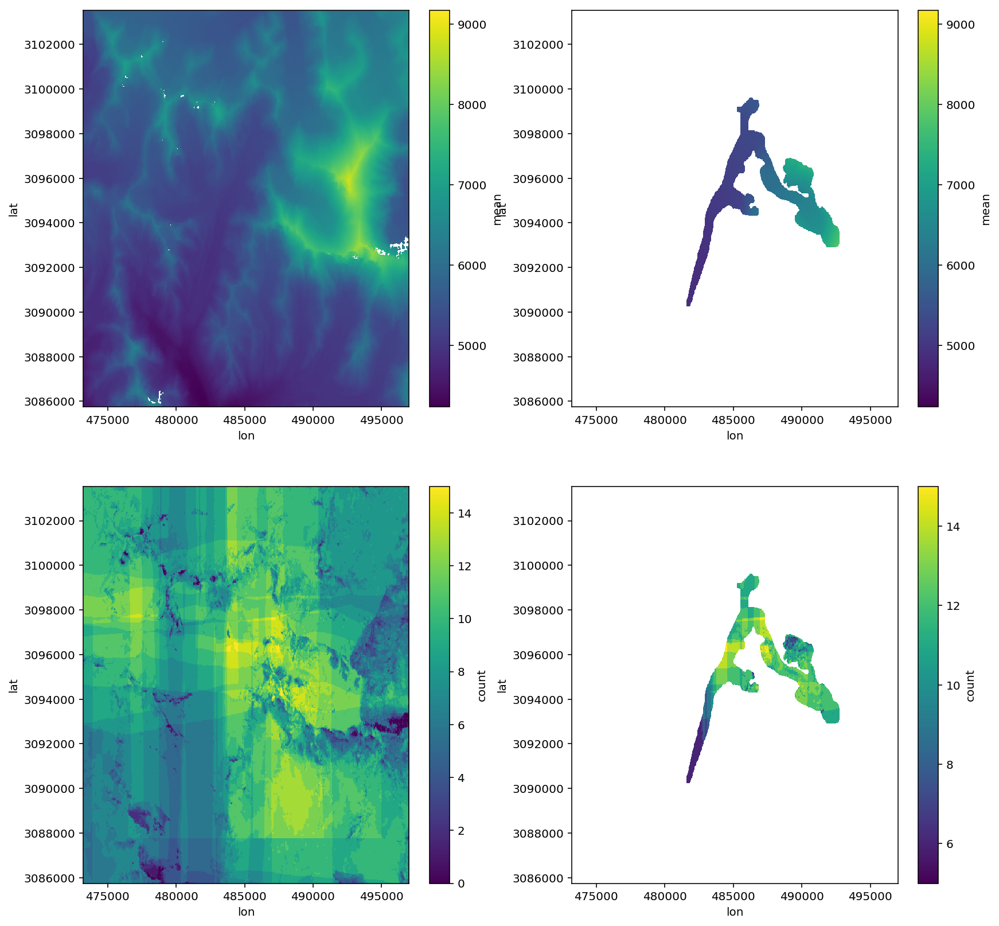

In [13]:
color_lim = (np.float32(x_band_data['mean'].min()), np.float32(x_band_data['mean'].max()))
print(color_lim)

print(type(x_band_data['mean']))
mean_masked = x_band_data['mean'].where(khumbu_shp_mask)
#x_band_data
#mask(khumbu_shp_mask)
print(type(mean_masked))
#ksduhf

fig = plt.figure(figsize=(14,14))
ax = plt.subplot(2,2,1)
x_band_data['mean'].plot()
ax = plt.subplot(2,2,2)
#plt.imshow(np.ma.array(x_band_data['mean'], mask=khumbu_shp_mask), clim=color_lim)
x_band_data['mean'].where(khumbu_shp_mask == False).plot(vmin=color_lim[0], 
                                                         vmax=color_lim[1])
#ax.clim(color_lim[0], color_lim[1])

ax = plt.subplot(2,2,3)
x_band_data['count'].plot()
ax = plt.subplot(2,2,4)
#plt.imshow(np.ma.array(coverage, mask=khumbu_shp_mask))
x_band_data['count'].where(khumbu_shp_mask == False).plot()

plt.savefig("../figures/data_overview.png")

# Looking only at glacier indices


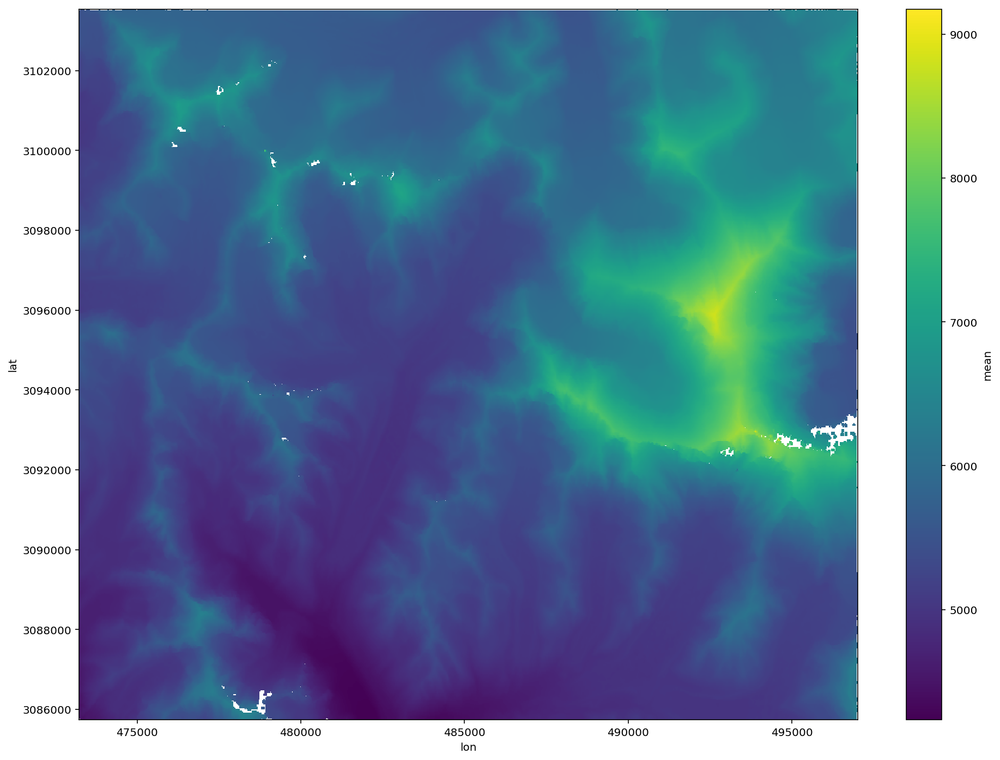

In [16]:
x_band_khumbu = x_band_data.where(khumbu_shp_mask == False)
x_band_khumbu['mean'].plot()

In [ ]:
#Get the array index of the maximum coverage
max_covarage_idx = np.unravel_index(coverage.argmax(), coverage.shape)


num_pixels = np.zeros(len(dem_list))
timestamps = [None]* len(dem_list)
decyears = np.zeros(len(dem_list))
for i in range(len(dem_list)):
    dem = dem_list[i]
    num_pixels[i] = np.sum(dem_list[i].data != 0)
    timestamps[i] = timelib.fn_getdatetime(path_to_files[i])
    decyears[i] =  timelib.dt2decyear(timestamps[i])

    print(timestamps[i])
    print("Num pixels covered: ", num_pixels[i])
    if dem[max_covarage_idx] != np.nan:
        print(max_covarage_idx)
        print('%0.1f m (%0.1f ft)' % (dem[max_covarage_idx], (dem[max_covarage_idx]*3.28084)))
    else:
        print("max_coverage_idx not included...")
    print ("")



In [ ]:
fig = plt.Figure(figsize=(4,4))
plt.plot(decyears[1:], num_pixels[1:])

In [ ]:
min_acceptab_num_pixels = 140000
print(sum(num_pixels > min_acceptab_num_pixels))
fig = plt.Figure(figsize=(4,4))
plt.plot(decyears[num_pixels > min_acceptab_num_pixels], 
         num_pixels[num_pixels > min_acceptab_num_pixels])

In [ ]:
indices = np.array([i for i in range(len(dem_list))])
large_coverage_decyears = decyears[num_pixels > min_acceptab_num_pixels]
large_coverage_indices = indices[num_pixels > min_acceptab_num_pixels]
for i in range(len(smaller_decyears)-1):
    print ("Days since prev dataset : ", 
           (large_coverage_decyears[i+1] - large_coverage_decyears[i])*365)
    
new_subset = large_coverage_decyears[1:] - large_coverage_decyears[:-1] > 50.0/365
print (new_subset)
new_subset = new_subset.tolist()
new_subset.append(False)
print (new_subset)



sparse_large_coverage_decyears = large_coverage_decyears[new_subset]
sparse_large_coverage_indices =   large_coverage_indices[new_subset]

print ("")
for i in range(len(sparse_large_coverage_decyears)-1):
    print ("Days since prev dataset : ", 
           (sparse_large_coverage_decyears[i+1] - sparse_large_coverage_decyears[i])*365)
    


In [21]:
#Function to generate a 3-panel plot for input arrays
def plot3panel(dem_list, clim=None, titles=None, cmap='inferno', label=None, overlay=None, fn=None):
    fig, axa = plt.subplots(1,3, sharex=True, sharey=True, figsize=(10,4))
    alpha = 1.0
    for n, ax in enumerate(axa):
        #Gray background
        ax.set_facecolor('0.5')
        #Force aspect ratio to match images
        ax.set(aspect='equal')
        #Turn off axes labels/ticks
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        if titles is not None:
            ax.set_title(titles[n])
        #Plot background shaded relief map
        if overlay is not None:
            alpha = 0.7
            axa[n].imshow(overlay[n], cmap='gray', clim=(1,255)) 
    #Plot each array 
    im_list = [axa[i].imshow(dem_list[i], clim=clim, cmap=cmap, alpha=alpha) for i in range(len(dem_list))]
    fig.tight_layout()
    fig.colorbar(im_list[0], ax=axa.ravel().tolist(), label=label, extend='both', shrink=0.5)
    if fn is not None:
        fig.savefig(fn, bbox_inches='tight', pad_inches=0, dpi=150)
    plt.show()
    
def plotFirst(ax, dem_list, clim=None, title=None, cmap='inferno', label=None, overlay=None, fn=None):
    alpha = 1.0
    #Gray background
    ax.set_facecolor('0.5')
    #Force aspect ratio to match images
    ax.set(aspect='equal')
    #Turn off axes labels/ticks
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    if titles is not None:
        ax.set_title(title)
    #Plot background shaded relief map
    if overlay is not None:
        alpha = 0.7
        ax.imshow(overlay, cmap='gray', clim=(1,255)) 
        
    im = ax.imshow(dem_list, clim=clim, cmap=cmap, alpha=alpha) 
    fig.tight_layout()
    #fig.colorbar(im, ax=ax.ravel().tolist(), label=label, extend='both', shrink=0.5)
    fig.colorbar(im, label=label, extend='both', shrink=0.5)
    if fn is not None:
        fig.savefig(fn, bbox_inches='tight', pad_inches=0, dpi=150)
    plt.show()
    return im

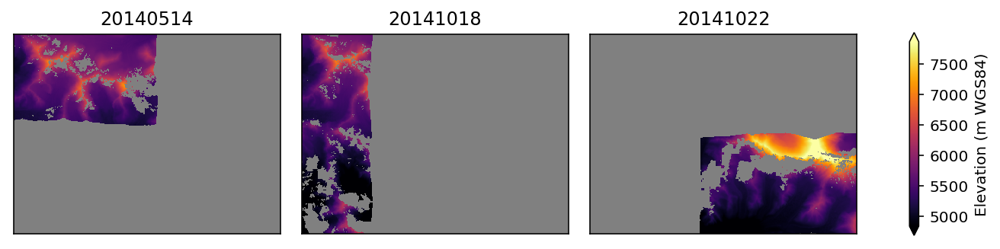

In [22]:
titles = [fn[:8] for fn in filenames]
#Find the 2nd and 98th percentile values to use for min/max limits of colorbar stretch
clim = malib.calcperc(dem_list[0], (2,98))
plot3panel(dem_list[10:13], clim, titles[10:13], 'inferno', 'Elevation (m WGS84)')

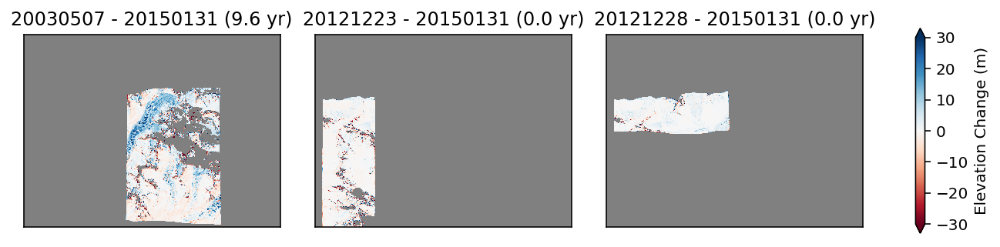

In [23]:
#Calculate elevation difference for each time period
#In this case, we will store the difference maps in a list for convenience
dh_list = [dem_list[0] - dem_list[ref_id], dem_list[1] - dem_list[ref_id], dem_list[2] - dem_list[ref_id]]
dh_titles = [titles[0]+" - "+titles[ref_id], titles[1]+" - "+titles[ref_id], 
               titles[2]+" - "+titles[ref_id]]

#Let's extract timestamps from filenames
t_list = np.array([timelib.fn_getdatetime(fn) for fn in filenames])

#Now let's compute total time between observations in decimal years
#Compute time differences, convert decimal years
dt_list = [timelib.timedelta2decyear(d) for d in np.diff(t_list)]
#Add the full 1970-2015 time difference
dt_list.append(dt_list[0]+dt_list[1])

#Now plot the elevation differences 
dh_titles2 = ['%s (%0.1f yr)' % (dh_titles[i], dt_list[i]) for i in range(3)]

plot3panel(dh_list, (-30, 30), dh_titles2, 'RdBu', 'Elevation Change (m)')

# Figures of change 

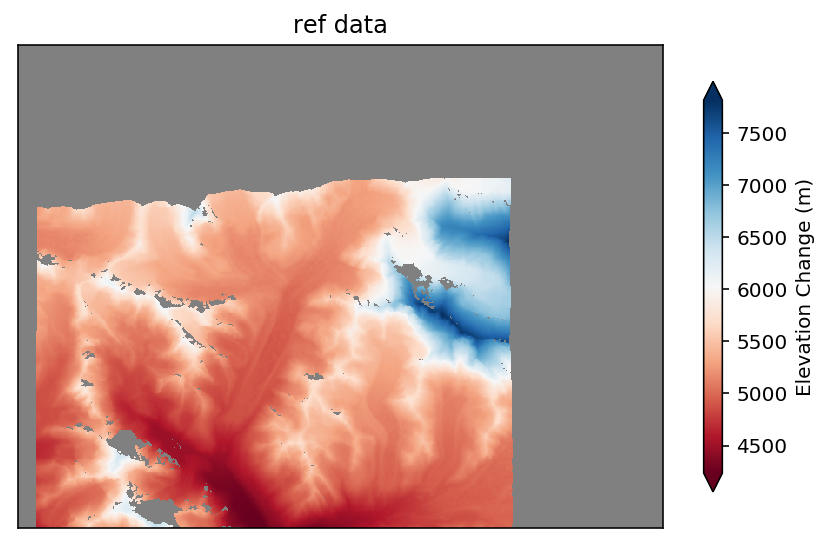

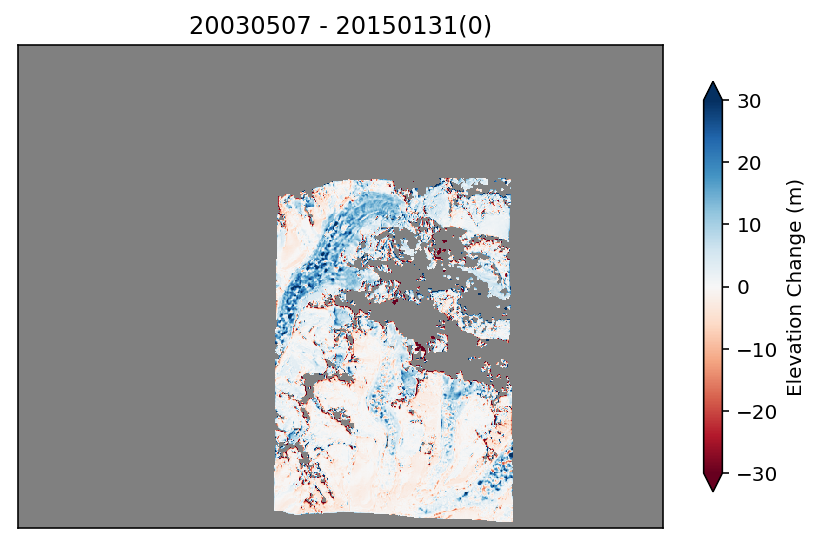

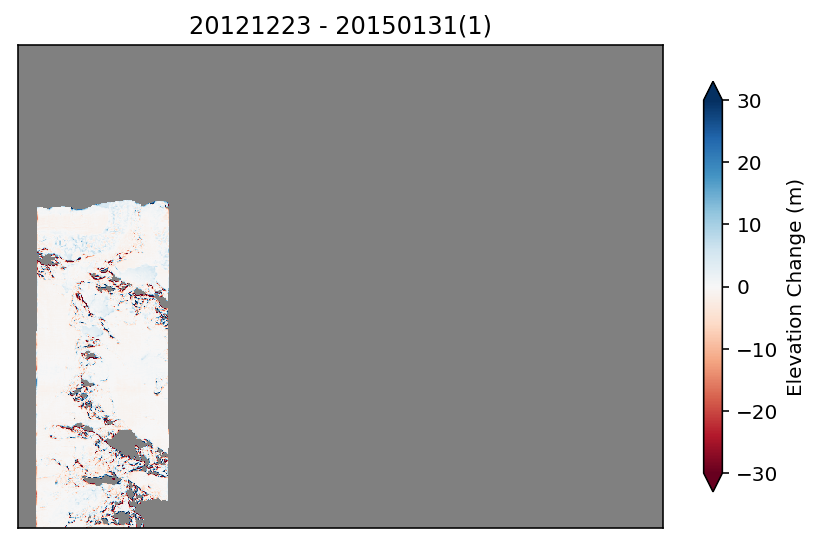

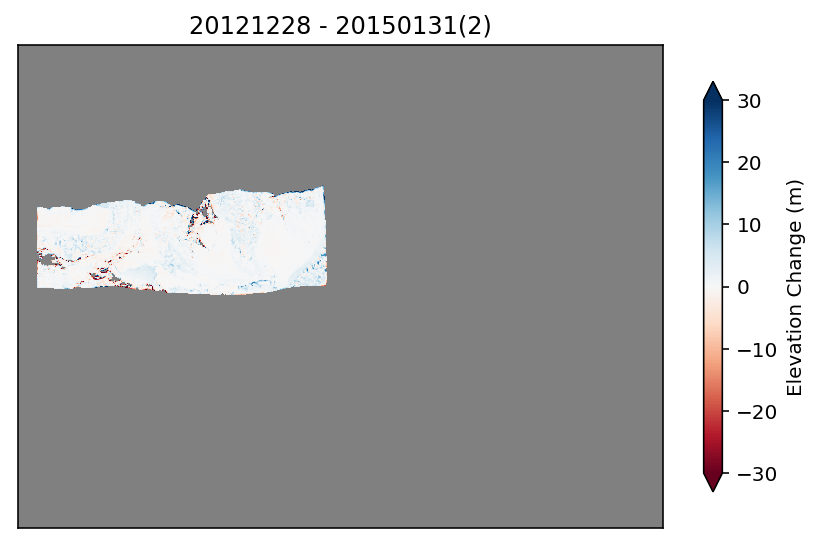

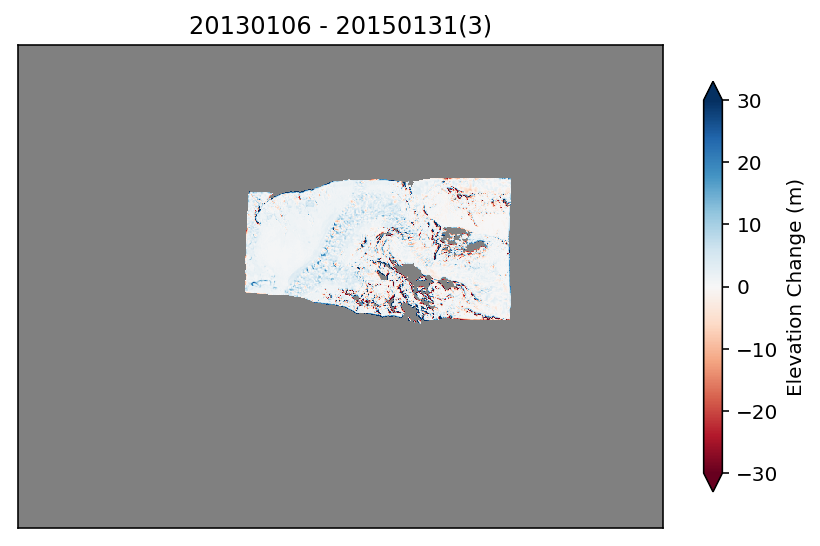

...

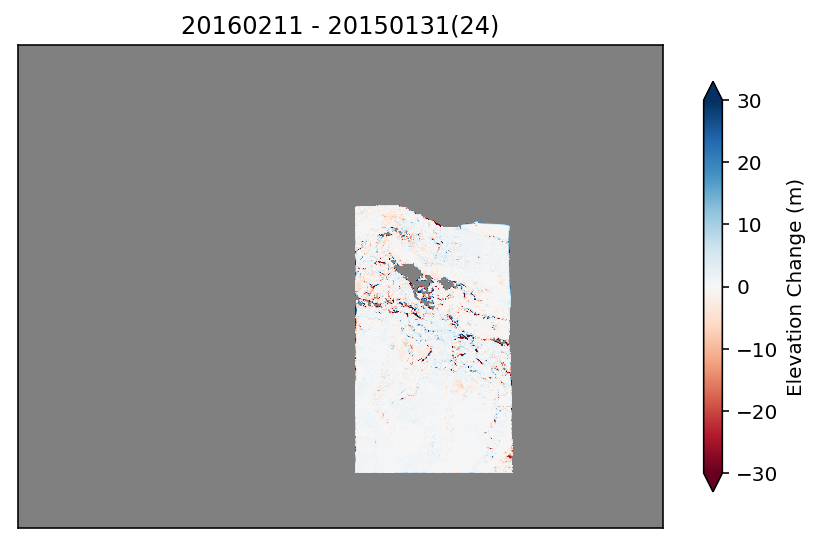

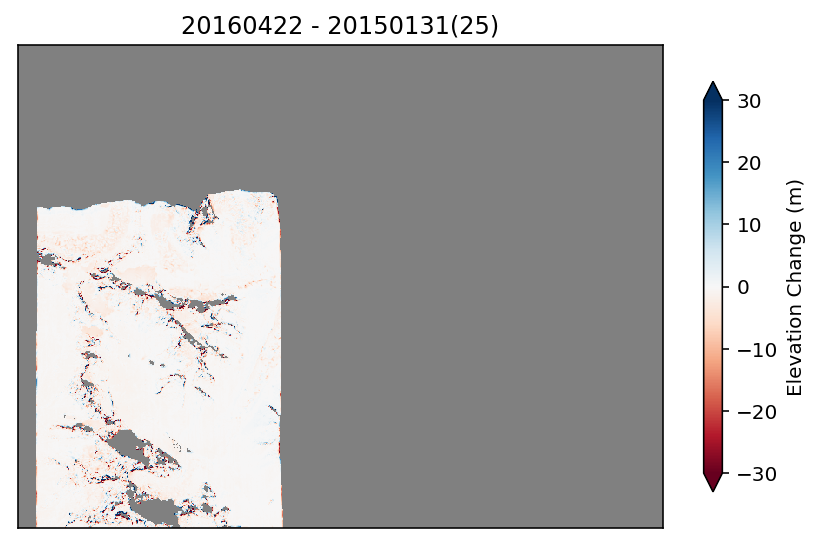

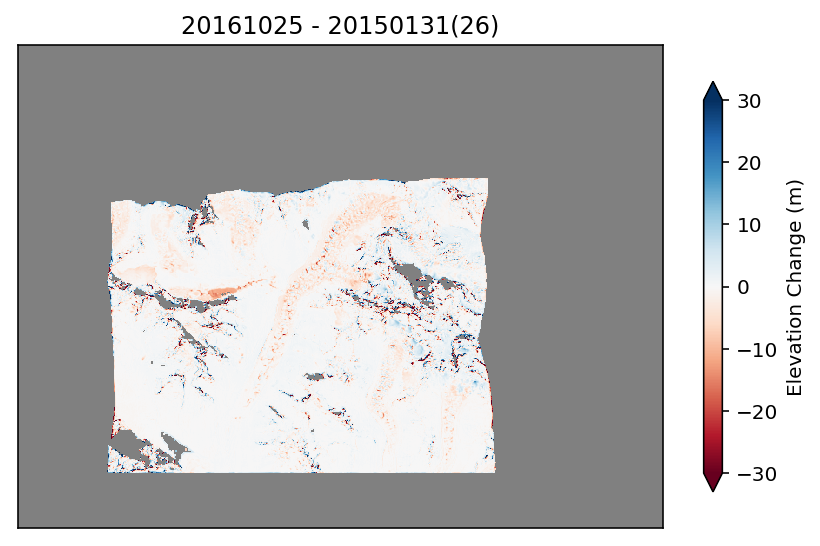

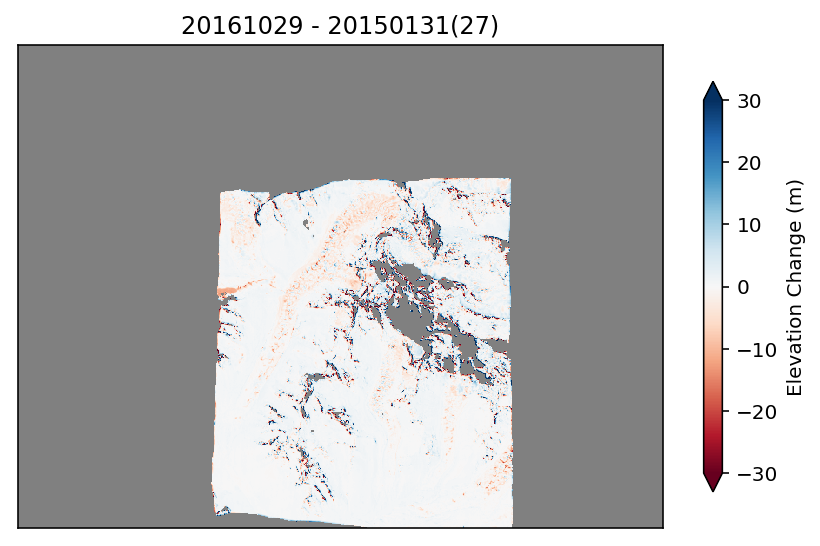

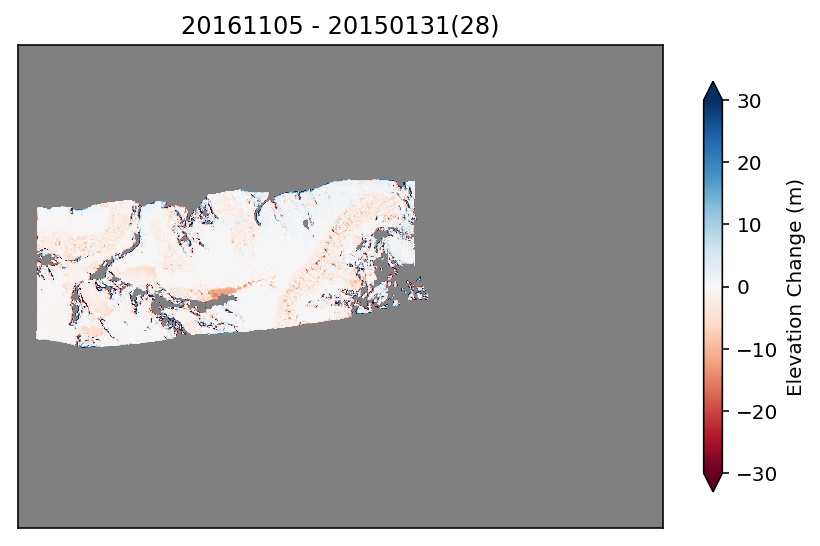

In [34]:
fig, ax = plt.subplots(1,1, sharex=True, sharey=True, figsize=(6,6))

title = "ref data"
im = plotFirst(ax, dem_list[ref_id], title=title, cmap='pink', label='Elevation Change (m)')


for i in range(len(dem_list)):
    
    fig, ax = plt.subplots(1,1, sharex=True, sharey=True, figsize=(6,6))

    dem_change = dem_list[i] - dem_list[ref_id]
    title = titles[i]+" - "+titles[ref_id] + "(" + str(i) + ")"
    im = plotFirst(ax, dem_change, (-30, 30), title, 'RdBu', 'Elevation Change (m)')
    
    


In [67]:
def purePlot(ax, dem, clim=None, title=None, cmap='inferno', label=None, overlay=None, fn=None):
    alpha = 1.0
    #Gray background
    ax.set_facecolor('0.5')
    #Force aspect ratio to match images
    ax.set(aspect='equal')
    #Turn off axes labels/ticks
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    if titles is not None:
        ax.set_title(title)
    #Plot background shaded relief map
    if overlay is not None:
        alpha = 0.7
        ax.imshow(overlay, cmap='gray', clim=(1,255)) 
        
    im = ax.imshow(dem, clim=clim, cmap=cmap, alpha=alpha) 
    #fig.tight_layout()
    #fig.colorbar(im, ax=ax.ravel().tolist(), label=label, extend='both', shrink=0.5)
    fig.colorbar(im, label=label, extend='both', shrink=0.5)
    if fn is not None:
        fig.savefig(fn, bbox_inches='tight', pad_inches=0, dpi=150)
    #plt.show()
    return im


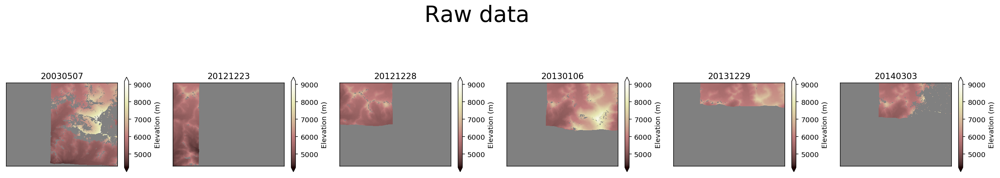

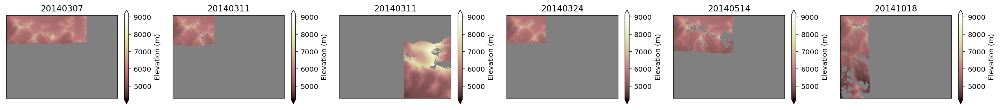

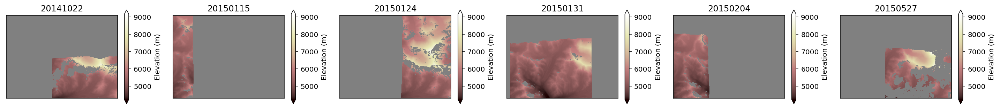

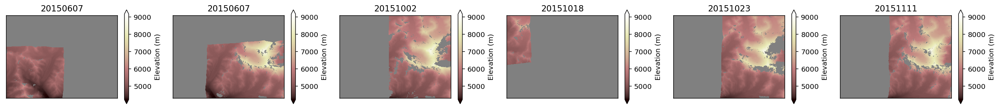

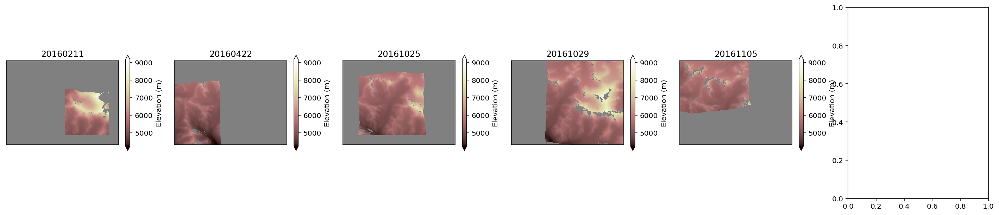

In [65]:
#fig = plt.figure(figsize=(25,20))

for row in range(5):
    fig = plt.figure(figsize=(25, 5))

    for col in range(6):

        ax = plt.subplot(1,6, col+1)
        #plt.imshow(dem_list[i])
        i = row*6 + col
        if i < len(dem_list):
            dem_change = dem_list[i]
            title = titles[i]
            im = purePlot(ax, dem_list[i], color_lim, title, cmap='pink', label='Elevation (m)')

    if row == 0:
        fig.suptitle('Raw data', fontsize=32)


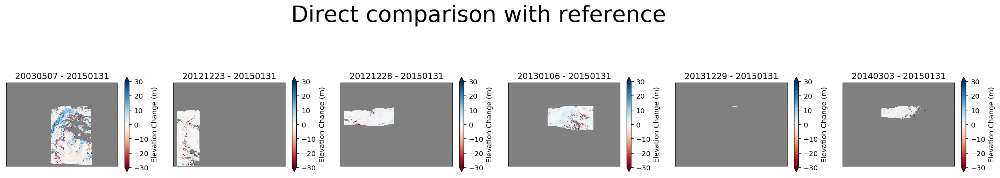

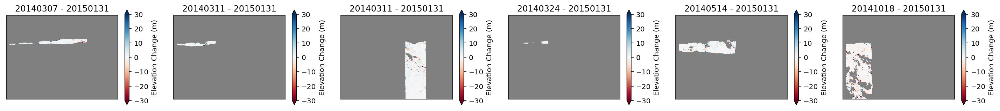

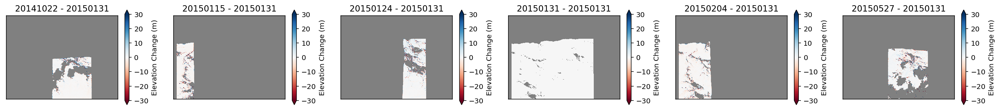

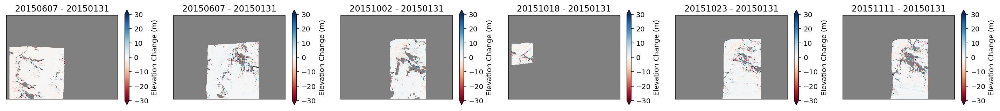

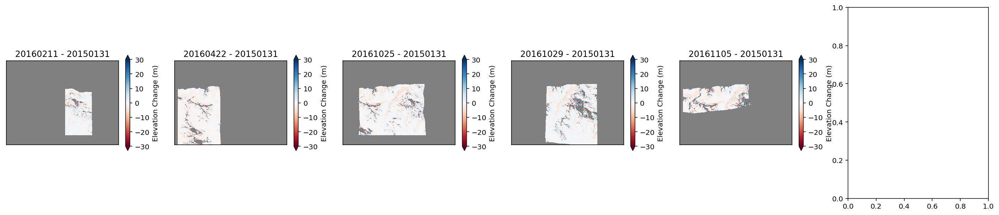

In [87]:

    
for row in range(5):
    fig = plt.figure(figsize=(25, 5))

    for col in range(6):

        ax = plt.subplot(1,6, col+1)
        #plt.imshow(dem_list[i])
        i = row*6 + col
        if i < len(dem_list):
            dem_change = dem_list[i] - dem_list[ref_id]
            title = titles[i]+" - "+titles[ref_id]
            im = purePlot(ax, dem_change, (-30, 30), title, 'RdBu', 'Elevation Change (m)')

    if row == 0:
        fig.suptitle('Direct comparison with reference', fontsize=32)

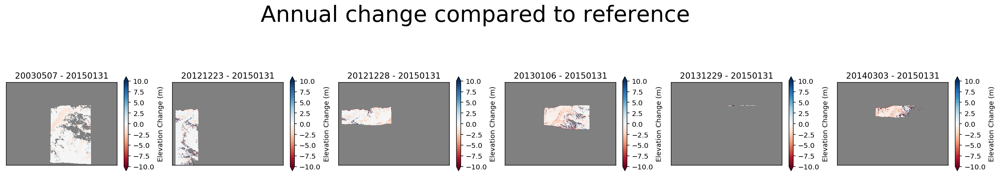

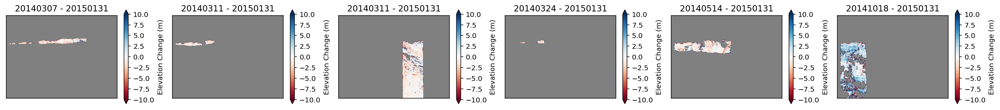

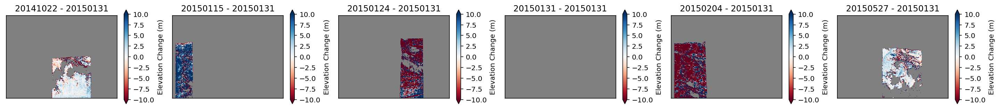

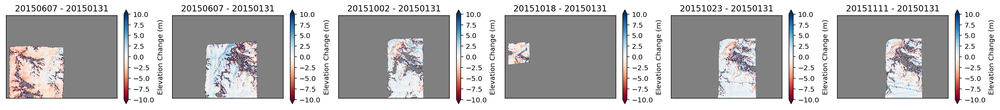

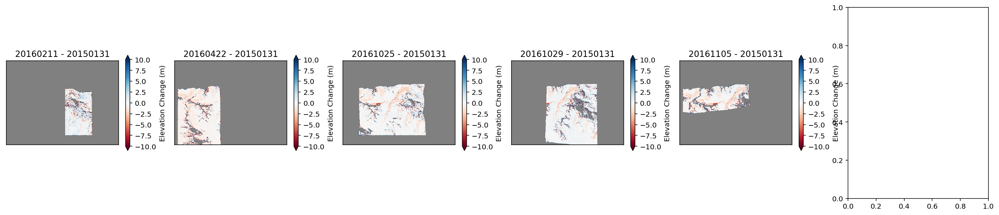

In [89]:
#dt_list = [timelib.timedelta2decyear(d) for d in np.diff(t_list)]


#Now let's compute total time between observations in decimal years
#Compute time differences, convert decimal years
deca_year_list = [timelib.dt2decyear(d) for d in t_list]
#Add the full 1970-2015 time difference


for row in range(5):
    #if row == 2:
    #    continue
    fig = plt.figure(figsize=(25, 5))

    for col in range(6):
        
        ax = plt.subplot(1,6, col+1)
        #plt.imshow(dem_list[i])
        i = row*6 + col
        if i < len(dem_list):
            dem_change = (dem_list[i] - dem_list[ref_id])/(deca_year_list[i] - deca_year_list[ref_id])
            title = titles[i]+" - "+titles[ref_id]
            im = purePlot(ax, dem_change, (-10, 10), title, 'RdBu', 'Elevation Change (m)')

    if row == 0:
        fig.suptitle('Annual change compared to reference', fontsize=32)

# Animations of changes 

In [ ]:
fig, ax = plt.subplots(1,1, sharex=True, sharey=True, figsize=(10,10))

dem_change = dem_list[0] - dem_list[ref_id]
title = titles[0]+" - "+titles[ref_id]
im = plotFirst(ax, dem_change, title=title)

def animate(i):
    print(i)
    dem_change = dem_list[i] - dem_list[ref_id]
    title = titles[i]+" - "+titles[ref_id]
    
    im.set_data(dem_change)
    #im.title(title)
    
    plt.draw()
    time.sleep(0.001)
    
             
anim = animation.FuncAnimation(fig, animate, range(len(dem_list)), interval=100)
plt.close(anim._fig)
anim